# Check Relevant Frames

In [6]:
import pickle
import os

print(os.getcwd())
print(os.listdir("/local1/bryanzhou008/project_jarvis/baselines"))

with open('/local1/bryanzhou008/project_jarvis/baselines/ego4d-eccv2022-solutions/scod/out.pkl', 'rb') as f:
    data = pickle.load(f)

data

/local1/bryanzhou008/project_jarvis/bryan_copied
['hands-and-objects', 'ego4d-eccv2022-solutions']


[[array([[1.15959924e+03, 6.43527405e+02, 1.54037183e+03, 9.53478882e+02,
          3.89553457e-01],
         [3.69952011e+01, 7.08247314e+02, 5.70097656e+02, 1.07338501e+03,
          2.28040338e-01],
         [5.99014359e+01, 7.15668579e+02, 5.66667786e+02, 9.71933533e+02,
          1.85567200e-01],
         [2.97474426e+02, 7.17295532e+02, 5.67370483e+02, 9.42016357e+02,
          1.83625892e-01],
         [3.76315369e+02, 7.16863464e+02, 5.67513428e+02, 9.31275330e+02,
          1.45607919e-01],
         [1.59172716e+01, 6.74232788e+02, 5.68910400e+02, 9.51511902e+02,
          1.43248901e-01],
         [1.15353298e+01, 6.87259888e+02, 5.92162048e+02, 1.07745349e+03,
          1.37694791e-01],
         [2.79445251e+02, 7.13227844e+02, 5.67414673e+02, 9.69998657e+02,
          1.35226533e-01],
         [4.18261528e+00, 6.88315369e+02, 5.66946655e+02, 9.57875183e+02,
          1.30057931e-01],
         [2.47960495e+02, 7.14036377e+02, 5.68000183e+02, 9.63199646e+02,
          1.22067

In [7]:
len(data)

12801

In [9]:
print(data[0])

[array([[1.15959924e+03, 6.43527405e+02, 1.54037183e+03, 9.53478882e+02,
        3.89553457e-01],
       [3.69952011e+01, 7.08247314e+02, 5.70097656e+02, 1.07338501e+03,
        2.28040338e-01],
       [5.99014359e+01, 7.15668579e+02, 5.66667786e+02, 9.71933533e+02,
        1.85567200e-01],
       [2.97474426e+02, 7.17295532e+02, 5.67370483e+02, 9.42016357e+02,
        1.83625892e-01],
       [3.76315369e+02, 7.16863464e+02, 5.67513428e+02, 9.31275330e+02,
        1.45607919e-01],
       [1.59172716e+01, 6.74232788e+02, 5.68910400e+02, 9.51511902e+02,
        1.43248901e-01],
       [1.15353298e+01, 6.87259888e+02, 5.92162048e+02, 1.07745349e+03,
        1.37694791e-01],
       [2.79445251e+02, 7.13227844e+02, 5.67414673e+02, 9.69998657e+02,
        1.35226533e-01],
       [4.18261528e+00, 6.88315369e+02, 5.66946655e+02, 9.57875183e+02,
        1.30057931e-01],
       [2.47960495e+02, 7.14036377e+02, 5.68000183e+02, 9.63199646e+02,
        1.22067168e-01],
       [6.61465912e+01, 7.132

In [15]:
import json

json.loads("/local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/DETR/ego4dv1_pnr_objects/inference/coco_instances_results.json")

print(desired)

JSONDecodeError: Expecting value: line 1 column 1 (char 0)

In [17]:
os.chdir('/local1/bryanzhou008/project_jarvis/baselines/ego4d-eccv2022-solutions/scod/')

In [18]:
import contextlib
import io
import itertools
import logging
import os.path as osp
import tempfile
import warnings
from collections import OrderedDict

import mmcv
import numpy as np
from mmcv.utils import print_log
from terminaltables import AsciiTable

from mmdet.core import eval_recalls
from .api_wrappers import COCO, COCOeval
from .builder import DATASETS
from .custom import CustomDataset

ModuleNotFoundError: No module named 'mmcv'

In [16]:
class Ego4D_SCOD_Dataset(CustomDataset):
    CLASSES = ('object_of_change',)

    PALETTE = [(220, 20, 60)]

    def load_annotations(self, ann_file):
        """Load annotation from COCO style annotation file.

        Args:
            ann_file (str): Path of annotation file.

        Returns:
            list[dict]: Annotation info from COCO api.
        """

        self.coco = COCO(ann_file)
        # The order of returned `cat_ids` will not
        # change with the order of the CLASSES
        self.cat_ids = self.coco.get_cat_ids(cat_names=self.CLASSES)
        self.cat2label = {cat_id: i for i, cat_id in enumerate(self.cat_ids)}
        self.img_ids = self.coco.get_img_ids()
        data_infos = []
        total_ann_ids = []
        for i in self.img_ids:
            info = self.coco.load_imgs([i])[0]
            info['filename'] = info['file_name']
            data_infos.append(info)
            ann_ids = self.coco.get_ann_ids(img_ids=[i])
            total_ann_ids.extend(ann_ids)
        assert len(set(total_ann_ids)) == len(
            total_ann_ids), f"Annotation ids in '{ann_file}' are not unique!"
        return data_infos

    def get_ann_info(self, idx):
        """Get COCO annotation by index.

        Args:
            idx (int): Index of data.

        Returns:
            dict: Annotation info of specified index.
        """

        img_id = self.data_infos[idx]['id']
        ann_ids = self.coco.get_ann_ids(img_ids=[img_id])
        ann_info = self.coco.load_anns(ann_ids)
        return self._parse_ann_info(self.data_infos[idx], ann_info)

    def get_cat_ids(self, idx):
        """Get COCO category ids by index.

        Args:
            idx (int): Index of data.

        Returns:
            list[int]: All categories in the image of specified index.
        """

        img_id = self.data_infos[idx]['id']
        ann_ids = self.coco.get_ann_ids(img_ids=[img_id])
        ann_info = self.coco.load_anns(ann_ids)
        return [ann['category_id'] for ann in ann_info]

    def _filter_imgs(self, min_size=32):
        """Filter images too small or without ground truths."""
        valid_inds = []
        # obtain images that contain annotation
        ids_with_ann = set(_['image_id'] for _ in self.coco.anns.values())
        # obtain images that contain annotations of the required categories
        ids_in_cat = set()
        for i, class_id in enumerate(self.cat_ids):
            ids_in_cat |= set(self.coco.cat_img_map[class_id])
        # merge the image id sets of the two conditions and use the merged set
        # to filter out images if self.filter_empty_gt=True
        ids_in_cat &= ids_with_ann

        valid_img_ids = []
        for i, img_info in enumerate(self.data_infos):
            img_id = self.img_ids[i]
            if self.filter_empty_gt and img_id not in ids_in_cat:
                continue
            if min(img_info['width'], img_info['height']) >= min_size:
                valid_inds.append(i)
                valid_img_ids.append(img_id)
        self.img_ids = valid_img_ids
        return valid_inds

    def _parse_ann_info(self, img_info, ann_info):
        """Parse bbox and mask annotation.

        Args:
            ann_info (list[dict]): Annotation info of an image.
            with_mask (bool): Whether to parse mask annotations.

        Returns:
            dict: A dict containing the following keys: bboxes, bboxes_ignore,\
                labels, masks, seg_map. "masks" are raw annotations and not \
                decoded into binary masks.
        """
        gt_bboxes = []
        gt_labels = []
        gt_bboxes_ignore = []
        gt_masks_ann = []
        for i, ann in enumerate(ann_info):
            if ann.get('ignore', False):
                continue
            x1, y1, w, h = ann['bbox']
            inter_w = max(0, min(x1 + w, img_info['width']) - max(x1, 0))
            inter_h = max(0, min(y1 + h, img_info['height']) - max(y1, 0))
            if inter_w * inter_h == 0:
                continue
            if ann['area'] <= 0 or w < 1 or h < 1:
                continue
            if ann['category_id'] not in self.cat_ids:
                continue
            bbox = [x1, y1, x1 + w, y1 + h]
            if ann.get('iscrowd', False):
                gt_bboxes_ignore.append(bbox)
            else:
                gt_bboxes.append(bbox)
                gt_labels.append(self.cat2label[ann['category_id']])
                gt_masks_ann.append(ann.get('segmentation', None))

        if gt_bboxes:
            gt_bboxes = np.array(gt_bboxes, dtype=np.float32)
            gt_labels = np.array(gt_labels, dtype=np.int64)
        else:
            gt_bboxes = np.zeros((0, 4), dtype=np.float32)
            gt_labels = np.array([], dtype=np.int64)

        if gt_bboxes_ignore:
            gt_bboxes_ignore = np.array(gt_bboxes_ignore, dtype=np.float32)
        else:
            gt_bboxes_ignore = np.zeros((0, 4), dtype=np.float32)

        seg_map = img_info['filename'].replace('jpg', 'png')

        ann = dict(
            bboxes=gt_bboxes,
            labels=gt_labels,
            bboxes_ignore=gt_bboxes_ignore,
            masks=gt_masks_ann,
            seg_map=seg_map)

        return ann

    def xyxy2xywh(self, bbox):
        """Convert ``xyxy`` style bounding boxes to ``xywh`` style for COCO
        evaluation.

        Args:
            bbox (numpy.ndarray): The bounding boxes, shape (4, ), in
                ``xyxy`` order.

        Returns:
            list[float]: The converted bounding boxes, in ``xywh`` order.
        """

        _bbox = bbox.tolist()
        return [
            _bbox[0],
            _bbox[1],
            _bbox[2] - _bbox[0],
            _bbox[3] - _bbox[1],
        ]

    def _proposal2json(self, results):
        """Convert proposal results to COCO json style."""
        json_results = []
        for idx in range(len(self)):
            img_id = self.img_ids[idx]
            bboxes = results[idx]
            for i in range(bboxes.shape[0]):
                data = dict()
                data['image_id'] = img_id
                data['bbox'] = self.xyxy2xywh(bboxes[i])
                data['score'] = float(bboxes[i][4])
                data['category_id'] = 1
                json_results.append(data)
        return json_results

    def _det2json(self, results):
        """Convert detection results to COCO json style."""
        json_results = []
        for idx in range(len(self)):
            img_id = self.img_ids[idx]
            result = results[idx]
            for label in range(len(result)):

                bboxes = result[label]
                for i in range(bboxes.shape[0]):
                    data = dict()
                    data['image_id'] = img_id
                    data['bbox'] = self.xyxy2xywh(bboxes[i])
                    data['score'] = float(bboxes[i][4])
                    data['category_id'] = self.cat_ids[label]
                    json_results.append(data)
        return json_results

    def _segm2json(self, results):
        """Convert instance segmentation results to COCO json style."""
        bbox_json_results = []
        segm_json_results = []
        for idx in range(len(self)):
            img_id = self.img_ids[idx]
            det, seg = results[idx]
            for label in range(len(det)):
                # bbox results
                bboxes = det[label]
                for i in range(bboxes.shape[0]):
                    data = dict()
                    data['image_id'] = img_id
                    data['bbox'] = self.xyxy2xywh(bboxes[i])
                    data['score'] = float(bboxes[i][4])
                    data['category_id'] = self.cat_ids[label]
                    bbox_json_results.append(data)

                # segm results
                # some detectors use different scores for bbox and mask
                if isinstance(seg, tuple):
                    segms = seg[0][label]
                    mask_score = seg[1][label]
                else:
                    segms = seg[label]
                    mask_score = [bbox[4] for bbox in bboxes]
                for i in range(bboxes.shape[0]):
                    data = dict()
                    data['image_id'] = img_id
                    data['bbox'] = self.xyxy2xywh(bboxes[i])
                    data['score'] = float(mask_score[i])
                    data['category_id'] = self.cat_ids[label]
                    if isinstance(segms[i]['counts'], bytes):
                        segms[i]['counts'] = segms[i]['counts'].decode()
                    data['segmentation'] = segms[i]
                    segm_json_results.append(data)
        return bbox_json_results, segm_json_results

    def results2json(self, results, outfile_prefix):
        """Dump the detection results to a COCO style json file.

        There are 3 types of results: proposals, bbox predictions, mask
        predictions, and they have different data types. This method will
        automatically recognize the type, and dump them to json files.

        Args:
            results (list[list | tuple | ndarray]): Testing results of the
                dataset.
            outfile_prefix (str): The filename prefix of the json files. If the
                prefix is "somepath/xxx", the json files will be named
                "somepath/xxx.bbox.json", "somepath/xxx.segm.json",
                "somepath/xxx.proposal.json".

        Returns:
            dict[str: str]: Possible keys are "bbox", "segm", "proposal", and \
                values are corresponding filenames.
        """
        result_files = dict()
        if isinstance(results[0], list):
            json_results = self._det2json(results)
            result_files['bbox'] = f'{outfile_prefix}.bbox.json'
            result_files['proposal'] = f'{outfile_prefix}.bbox.json'
            mmcv.dump(json_results, result_files['bbox'])
        elif isinstance(results[0], tuple):
            json_results = self._segm2json(results)
            result_files['bbox'] = f'{outfile_prefix}.bbox.json'
            result_files['proposal'] = f'{outfile_prefix}.bbox.json'
            result_files['segm'] = f'{outfile_prefix}.segm.json'
            mmcv.dump(json_results[0], result_files['bbox'])
            mmcv.dump(json_results[1], result_files['segm'])
        elif isinstance(results[0], np.ndarray):
            json_results = self._proposal2json(results)
            result_files['proposal'] = f'{outfile_prefix}.proposal.json'
            mmcv.dump(json_results, result_files['proposal'])
        else:
            raise TypeError('invalid type of results')
        return result_files

    def fast_eval_recall(self, results, proposal_nums, iou_thrs, logger=None):
        gt_bboxes = []
        for i in range(len(self.img_ids)):
            ann_ids = self.coco.get_ann_ids(img_ids=self.img_ids[i])
            ann_info = self.coco.load_anns(ann_ids)
            if len(ann_info) == 0:
                gt_bboxes.append(np.zeros((0, 4)))
                continue
            bboxes = []
            for ann in ann_info:
                if ann.get('ignore', False) or ann['iscrowd']:
                    continue
                x1, y1, w, h = ann['bbox']
                bboxes.append([x1, y1, x1 + w, y1 + h])
            bboxes = np.array(bboxes, dtype=np.float32)
            if bboxes.shape[0] == 0:
                bboxes = np.zeros((0, 4))
            gt_bboxes.append(bboxes)

        recalls = eval_recalls(
            gt_bboxes, results, proposal_nums, iou_thrs, logger=logger)
        ar = recalls.mean(axis=1)
        return ar

    def format_results(self, results, jsonfile_prefix=None, **kwargs):
        """Format the results to json (standard format for COCO evaluation).

        Args:
            results (list[tuple | numpy.ndarray]): Testing results of the
                dataset.
            jsonfile_prefix (str | None): The prefix of json files. It includes
                the file path and the prefix of filename, e.g., "a/b/prefix".
                If not specified, a temp file will be created. Default: None.

        Returns:
            tuple: (result_files, tmp_dir), result_files is a dict containing \
                the json filepaths, tmp_dir is the temporal directory created \
                for saving json files when jsonfile_prefix is not specified.
        """
        assert isinstance(results, list), 'results must be a list'
        assert len(results) == len(self), (
            'The length of results is not equal to the dataset len: {} != {}'.
            format(len(results), len(self)))

        if jsonfile_prefix is None:
            tmp_dir = tempfile.TemporaryDirectory()
            jsonfile_prefix = osp.join(tmp_dir.name, 'results')
        else:
            tmp_dir = None
        result_files = self.results2json(results, jsonfile_prefix)
        return result_files, tmp_dir

    def evaluate_det_segm(self,
                          results,
                          result_files,
                          coco_gt,
                          metrics,
                          logger=None,
                          classwise=False,
                          proposal_nums=(100, 300, 1000),
                          iou_thrs=None,
                          metric_items=None):
        """Instance segmentation and object detection evaluation in COCO
        protocol.

        Args:
            results (list[list | tuple | dict]): Testing results of the
                dataset.
            result_files (dict[str, str]): a dict contains json file path.
            coco_gt (COCO): COCO API object with ground truth annotation.
            metric (str | list[str]): Metrics to be evaluated. Options are
                'bbox', 'segm', 'proposal', 'proposal_fast'.
            logger (logging.Logger | str | None): Logger used for printing
                related information during evaluation. Default: None.
            classwise (bool): Whether to evaluating the AP for each class.
            proposal_nums (Sequence[int]): Proposal number used for evaluating
                recalls, such as recall@100, recall@1000.
                Default: (100, 300, 1000).
            iou_thrs (Sequence[float], optional): IoU threshold used for
                evaluating recalls/mAPs. If set to a list, the average of all
                IoUs will also be computed. If not specified, [0.50, 0.55,
                0.60, 0.65, 0.70, 0.75, 0.80, 0.85, 0.90, 0.95] will be used.
                Default: None.
            metric_items (list[str] | str, optional): Metric items that will
                be returned. If not specified, ``['AR@100', 'AR@300',
                'AR@1000', 'AR_s@1000', 'AR_m@1000', 'AR_l@1000' ]`` will be
                used when ``metric=='proposal'``, ``['mAP', 'mAP_50', 'mAP_75',
                'mAP_s', 'mAP_m', 'mAP_l']`` will be used when
                ``metric=='bbox' or metric=='segm'``.

        Returns:
            dict[str, float]: COCO style evaluation metric.
        """
        if iou_thrs is None:
            iou_thrs = np.linspace(
                .5, 0.95, int(np.round((0.95 - .5) / .05)) + 1, endpoint=True)
        if metric_items is not None:
            if not isinstance(metric_items, list):
                metric_items = [metric_items]

        eval_results = OrderedDict()
        for metric in metrics:
            msg = f'Evaluating {metric}...'
            if logger is None:
                msg = '\n' + msg
            print_log(msg, logger=logger)

            if metric == 'proposal_fast':
                if isinstance(results[0], tuple):
                    raise KeyError('proposal_fast is not supported for '
                                   'instance segmentation result.')
                ar = self.fast_eval_recall(
                    results, proposal_nums, iou_thrs, logger='silent')
                log_msg = []
                for i, num in enumerate(proposal_nums):
                    eval_results[f'AR@{num}'] = ar[i]
                    log_msg.append(f'\nAR@{num}\t{ar[i]:.4f}')
                log_msg = ''.join(log_msg)
                print_log(log_msg, logger=logger)
                continue

            iou_type = 'bbox' if metric == 'proposal' else metric
            if metric not in result_files:
                raise KeyError(f'{metric} is not in results')
            try:
                predictions = mmcv.load(result_files[metric])
                if iou_type == 'segm':
                    # Refer to https://github.com/cocodataset/cocoapi/blob/master/PythonAPI/pycocotools/coco.py#L331  # noqa
                    # When evaluating mask AP, if the results contain bbox,
                    # cocoapi will use the box area instead of the mask area
                    # for calculating the instance area. Though the overall AP
                    # is not affected, this leads to different
                    # small/medium/large mask AP results.
                    for x in predictions:
                        x.pop('bbox')
                    warnings.simplefilter('once')
                    warnings.warn(
                        'The key "bbox" is deleted for more accurate mask AP '
                        'of small/medium/large instances since v2.12.0. This '
                        'does not change the overall mAP calculation.',
                        UserWarning)
                coco_det = coco_gt.loadRes(predictions)
            except IndexError:
                print_log(
                    'The testing results of the whole dataset is empty.',
                    logger=logger,
                    level=logging.ERROR)
                break

            cocoEval = COCOeval(coco_gt, coco_det, iou_type)
            cocoEval.params.catIds = self.cat_ids
            cocoEval.params.imgIds = self.img_ids
            cocoEval.params.maxDets = list(proposal_nums)
            cocoEval.params.iouThrs = iou_thrs
            # mapping of cocoEval.stats
            coco_metric_names = {
                'mAP': 0,
                'mAP_50': 1,
                'mAP_75': 2,
                'mAP_s': 3,
                'mAP_m': 4,
                'mAP_l': 5,
                'AR@100': 6,
                'AR@300': 7,
                'AR@1000': 8,
                'AR_s@1000': 9,
                'AR_m@1000': 10,
                'AR_l@1000': 11
            }
            if metric_items is not None:
                for metric_item in metric_items:
                    if metric_item not in coco_metric_names:
                        raise KeyError(
                            f'metric item {metric_item} is not supported')

            if metric == 'proposal':
                cocoEval.params.useCats = 0
                cocoEval.evaluate()
                cocoEval.accumulate()

                # Save coco summarize print information to logger
                redirect_string = io.StringIO()
                with contextlib.redirect_stdout(redirect_string):
                    cocoEval.summarize()
                print_log('\n' + redirect_string.getvalue(), logger=logger)

                if metric_items is None:
                    metric_items = [
                        'AR@100', 'AR@300', 'AR@1000', 'AR_s@1000',
                        'AR_m@1000', 'AR_l@1000'
                    ]

                for item in metric_items:
                    val = float(
                        f'{cocoEval.stats[coco_metric_names[item]]:.3f}')
                    eval_results[item] = val
            else:
                cocoEval.evaluate()
                cocoEval.accumulate()

                # Save coco summarize print information to logger
                redirect_string = io.StringIO()
                with contextlib.redirect_stdout(redirect_string):
                    cocoEval.summarize()
                print_log('\n' + redirect_string.getvalue(), logger=logger)

                if classwise:  # Compute per-category AP
                    # Compute per-category AP
                    # from https://github.com/facebookresearch/detectron2/
                    precisions = cocoEval.eval['precision']
                    # precision: (iou, recall, cls, area range, max dets)
                    assert len(self.cat_ids) == precisions.shape[2]

                    results_per_category = []
                    for idx, catId in enumerate(self.cat_ids):
                        # area range index 0: all area ranges
                        # max dets index -1: typically 100 per image
                        nm = self.coco.loadCats(catId)[0]
                        precision = precisions[:, :, idx, 0, -1]
                        precision = precision[precision > -1]
                        if precision.size:
                            ap = np.mean(precision)
                        else:
                            ap = float('nan')
                        results_per_category.append(
                            (f'{nm["name"]}', f'{float(ap):0.3f}'))

                    num_columns = min(6, len(results_per_category) * 2)
                    results_flatten = list(
                        itertools.chain(*results_per_category))
                    headers = ['category', 'AP'] * (num_columns // 2)
                    results_2d = itertools.zip_longest(*[
                        results_flatten[i::num_columns]
                        for i in range(num_columns)
                    ])
                    table_data = [headers]
                    table_data += [result for result in results_2d]
                    table = AsciiTable(table_data)
                    print_log('\n' + table.table, logger=logger)

                if metric_items is None:
                    metric_items = [
                        'mAP', 'mAP_50', 'mAP_75', 'mAP_s', 'mAP_m', 'mAP_l'
                    ]

                for metric_item in metric_items:
                    key = f'{metric}_{metric_item}'
                    val = float(
                        f'{cocoEval.stats[coco_metric_names[metric_item]]:.3f}'
                    )
                    eval_results[key] = val
                ap = cocoEval.stats[:6]
                eval_results[f'{metric}_mAP_copypaste'] = (
                    f'{ap[0]:.3f} {ap[1]:.3f} {ap[2]:.3f} {ap[3]:.3f} '
                    f'{ap[4]:.3f} {ap[5]:.3f}')

        return eval_results

    def evaluate(self,
                 results,
                 metric='bbox',
                 logger=None,
                 jsonfile_prefix=None,
                 classwise=False,
                 proposal_nums=(100, 300, 1000),
                 iou_thrs=None,
                 metric_items=None):
        """Evaluation in COCO protocol.

        Args:
            results (list[list | tuple]): Testing results of the dataset.
            metric (str | list[str]): Metrics to be evaluated. Options are
                'bbox', 'segm', 'proposal', 'proposal_fast'.
            logger (logging.Logger | str | None): Logger used for printing
                related information during evaluation. Default: None.
            jsonfile_prefix (str | None): The prefix of json files. It includes
                the file path and the prefix of filename, e.g., "a/b/prefix".
                If not specified, a temp file will be created. Default: None.
            classwise (bool): Whether to evaluating the AP for each class.
            proposal_nums (Sequence[int]): Proposal number used for evaluating
                recalls, such as recall@100, recall@1000.
                Default: (100, 300, 1000).
            iou_thrs (Sequence[float], optional): IoU threshold used for
                evaluating recalls/mAPs. If set to a list, the average of all
                IoUs will also be computed. If not specified, [0.50, 0.55,
                0.60, 0.65, 0.70, 0.75, 0.80, 0.85, 0.90, 0.95] will be used.
                Default: None.
            metric_items (list[str] | str, optional): Metric items that will
                be returned. If not specified, ``['AR@100', 'AR@300',
                'AR@1000', 'AR_s@1000', 'AR_m@1000', 'AR_l@1000' ]`` will be
                used when ``metric=='proposal'``, ``['mAP', 'mAP_50', 'mAP_75',
                'mAP_s', 'mAP_m', 'mAP_l']`` will be used when
                ``metric=='bbox' or metric=='segm'``.

        Returns:
            dict[str, float]: COCO style evaluation metric.
        """

        metrics = metric if isinstance(metric, list) else [metric]
        allowed_metrics = ['bbox', 'segm', 'proposal', 'proposal_fast']
        for metric in metrics:
            if metric not in allowed_metrics:
                raise KeyError(f'metric {metric} is not supported')

        coco_gt = self.coco
        self.cat_ids = coco_gt.get_cat_ids(cat_names=self.CLASSES)

        result_files, tmp_dir = self.format_results(results, jsonfile_prefix)
        eval_results = self.evaluate_det_segm(results, result_files, coco_gt,
                                              metrics, logger, classwise,
                                              proposal_nums, iou_thrs,
                                              metric_items)

        if tmp_dir is not None:
            tmp_dir.cleanup()
        return eval_results


NameError: name 'CustomDataset' is not defined

In [4]:
from moviepy.video.io.ffmpeg_tools import ffmpeg_extract_subclip
import json
import os
from ipywidgets import Video, Image
from IPython.display import display
import cv2
import numpy as np
import matplotlib.pyplot as plt

class Narration:
    def __init__(self, text, begin_timestamp, end_timestamp=None):
        self.text = text
        self.begin = begin_timestamp
        self.end = end_timestamp

In [5]:
def get_narrations(video_key, narrations_path):
    narration_objs = []
    
    with open(narrations_path) as f:
        data = json.load(f)
        narrations = data[video_key]["narration_pass_1"]["narrations"]
        for narration in narrations:
            if narration_objs:
                narration_objs[-1].end = narration["timestamp_sec"]
            narration_objs.append(Narration(narration["narration_text"],narration["timestamp_sec"]))

    # print narrations (for debugging and choosing steps)
    for i in range(len(narration_objs)):
        print("Annotations for step {}:".format(i), narration_objs[i].text)
        print("Begin-time for step {}: ".format(i),narration_objs[i].begin)
        print("Finish-time for step {}:".format(i),narration_objs[i].end)
        print("------------")
        
    return narration_objs

In [60]:
def get_frames_for_step(video_key, step, narration_objs, video_path, clip_save_path):
    
    print("Annotation for step {}:".format(step), narration_objs[step].text)
    print("Begin-time for step {}: ".format(step),narration_objs[step].begin)
    print("Ended-time for step {}:".format(step),narration_objs[step].end)
    print("------------")
    
    
    # extract and save the subclip to "clip_save_path"
    clip_file_path = clip_save_path + video_key + "_" + str(step) + ".mp4"
    
    ffmpeg_extract_subclip(video_path, narration_objs[step].begin, 
                           narration_objs[step].end, 
                           targetname = clip_file_path)
    
    
    # capture the video
    cap = cv2.VideoCapture(clip_file_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps    = cap.get(cv2.CAP_PROP_FPS)
    
    # for debugging
#     print('Total frames: ' + str(total_frames))
#     print('width: ' + str(width))
#     print('height: ' + str(height))
#     print('fps: ' + str(fps))
    
    
    success_1, success_2 = False, False
    first_frame_num, last_frame_num = 0, total_frames
    
    

    
    while not success_1:
        cap.set(cv2.CAP_PROP_POS_FRAMES, first_frame_num)
        success_1, image_1 = cap.read()
        first_frame_num += 1
    while not success_2:
        cap.set(cv2.CAP_PROP_POS_FRAMES, last_frame_num)
        success_2, image_2 = cap.read()
        last_frame_num -= 1
        
        
    success_3 = False
    image_3_num = last_frame_num-30
    success_4 = False
    image_4_num = last_frame_num-60
    
    
    while not success_3:
        cap.set(cv2.CAP_PROP_POS_FRAMES, image_3_num)
        success_3, image_3 = cap.read()
        image_3_num += 1
    while not success_4:
        cap.set(cv2.CAP_PROP_POS_FRAMES, image_4_num)
        success_4, image_4 = cap.read()
        image_4_num += 1
    
    


    plt.figure()
    f, ax = plt.subplots(2,2) 
    
    ax[0,0].set_title('First Frame')
    ax[0,1].set_title('Last Frame')
    ax[1,0].set_title('1s Before Last Frame')
    ax[1,1].set_title('2s Before Last Frame')
    
    
#     image1 = image1[:, :, ::-1]
#     image2 = image2[:, :, ::-1]
#     image3 = image3[:, :, ::-1]
#     image4 = image4[:, :, ::-1]
    
    
    ax[0,0].imshow(image_1)
    ax[0,1].imshow(image_2)
    ax[1,0].imshow(image_3)
    ax[1,1].imshow(image_4)
    
    [axi.set_axis_off() for axi in ax.ravel()]
    
    plt.show()
    
    return(clip_file_path)

# Video 1

In [61]:
# Hyperparameters

narrations_path = "/local1/hu528/ego4d_data/v1/annotations/narration.json"
video_path = "/local1/hu528/ego4d_data/v1/full_scale/a67789f8-3788-4a8d-aba8-9b2c2945d457.mp4"
clip_save_path = "/local1/bryanzhou008/ego4d/v1/clips/"
video_key = "a67789f8-3788-4a8d-aba8-9b2c2945d457"

In [62]:
narration_objs = get_narrations(video_key, narrations_path)

Annotations for step 0: #C C kneads dough with both hands
Begin-time for step 0:  1058.0876952666665
Finish-time for step 0: 1062.9511552666665
------------
Annotations for step 1: #C C rolls dough with both hands
Begin-time for step 1:  1062.9511552666665
Finish-time for step 1: 1072.2738652666665
------------
Annotations for step 2: #C C flips dough with both hands
Begin-time for step 2:  1072.2738652666665
Finish-time for step 2: 1073.3280252666666
------------
Annotations for step 3: #C C kneads dough with both hands
Begin-time for step 3:  1073.3280252666666
Finish-time for step 3: 1075.0543352666666
------------
Annotations for step 4: #C C rolls dough with both hands
Begin-time for step 4:  1075.0543352666666
Finish-time for step 4: 1088.0101052666664
------------
Annotations for step 5: #C C transfers dough to stove
Begin-time for step 5:  1088.0101052666664
Finish-time for step 5: 1093.0607452666666
------------
Annotations for step 6: #C C shoves wood into stove
Begin-time fo

Annotation for step 26: #C C transfers dough to stove 
Begin-time for step 26:  1176.3522052666665
Ended-time for step 26: 1182.4383052666665
------------
Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful


<Figure size 640x480 with 0 Axes>

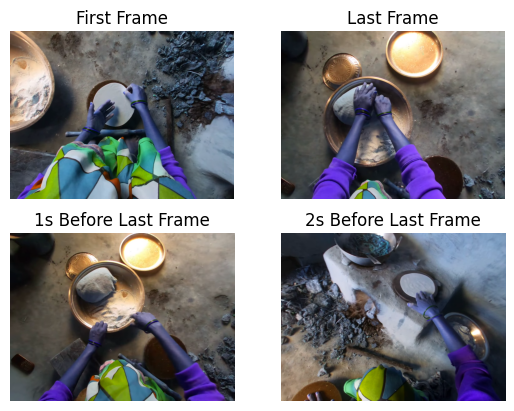

In [63]:
clip_file_path = get_frames_for_step(video_key, 26, narration_objs, video_path, clip_save_path)

In [64]:
# the complete clip for this step
Video.from_file(clip_file_path, width = 320, height = 320)

Video(value=b"\x00\x00\x00\x1cftypisom\x00\x00\x02\x00isomiso2mp41\x00\x00\x00\x08free\x00'\x86\x87...", heigh…

Annotation for step 26: #C C transfers dough to stove 
Begin-time for step 26:  1176.3522052666665
Ended-time for step 26: 1182.4383052666665
------------
Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful


<Figure size 640x480 with 0 Axes>

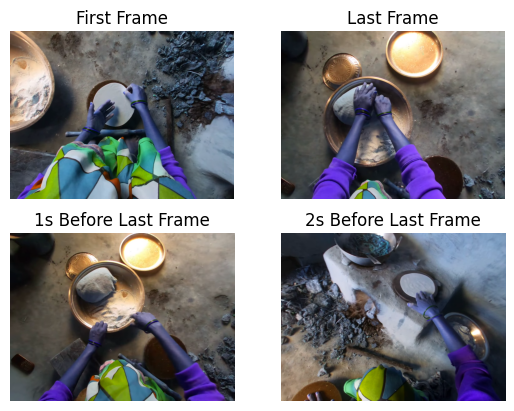

In [11]:
clip_file_path = get_frames_for_step(video_key, 26, narration_objs, video_path, clip_save_path)

In [12]:
# the complete clip for this step
Video.from_file(clip_file_path, width = 320, height = 320)

Video(value=b"\x00\x00\x00\x1cftypisom\x00\x00\x02\x00isomiso2mp41\x00\x00\x00\x08free\x00'\x86\x87...", heigh…

## 2. For some steps, though annotation is accurate, it is still hard to tell whether the task is complete

Annotation for step 50: #C C flips dough
Begin-time for step 50:  1296.0927152666666
Ended-time for step 50: 1298.2405252666665
------------
Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful


<Figure size 640x480 with 0 Axes>

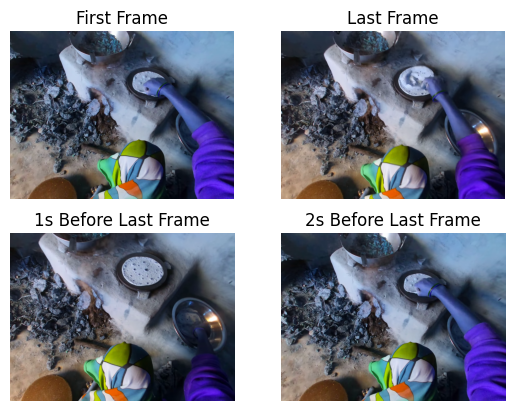

In [13]:
clip_file_path = get_frames_for_step(video_key, 50, narration_objs, video_path, clip_save_path)

In [14]:
# the complete clip for this step
Video.from_file(clip_file_path, width = 320, height = 320)

Video(value=b'\x00\x00\x00\x1cftypisom\x00\x00\x02\x00isomiso2mp41\x00\x00\x00\x08free\x00\nSH...', height='32…

## 3. For some steps, annotations are slightly off, but this has very bad impact on pre/post conditon analysis

Annotation for step 26: #C C transfers dough to stove 
Begin-time for step 26:  1176.3522052666665
Ended-time for step 26: 1182.4383052666665
------------
Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful


<Figure size 640x480 with 0 Axes>

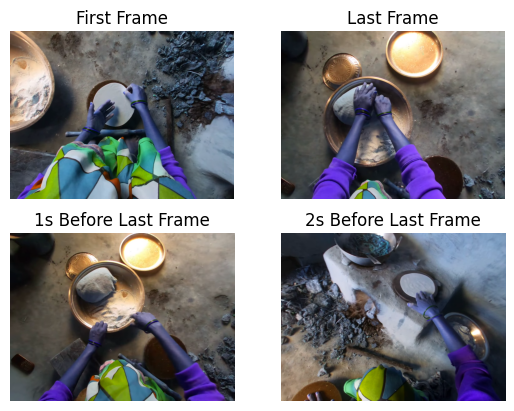

In [15]:
clip_file_path = get_frames_for_step(video_key, 26, narration_objs, video_path, clip_save_path)

In [16]:
# the complete clip for this step
Video.from_file(clip_file_path, width = 320, height = 320)

Video(value=b"\x00\x00\x00\x1cftypisom\x00\x00\x02\x00isomiso2mp41\x00\x00\x00\x08free\x00'\x86\x87...", heigh…

Annotation for step 5: #C C transfers dough to stove
Begin-time for step 5:  1088.0101052666664
Ended-time for step 5: 1093.0607452666666
------------
Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful


<Figure size 640x480 with 0 Axes>

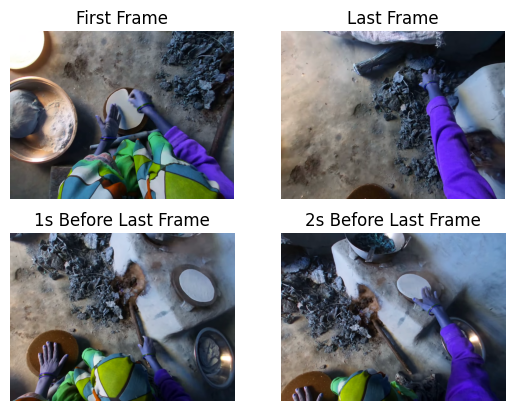

In [17]:
clip_file_path = get_frames_for_step(video_key, 5, narration_objs, video_path, clip_save_path)

In [18]:
# the complete clip for this step
Video.from_file(clip_file_path, width = 320, height = 320)

Video(value=b'\x00\x00\x00\x1cftypisom\x00\x00\x02\x00isomiso2mp41\x00\x00\x00\x08free\x00\x18\xc9w...', heigh…

# Video 2

In [19]:
video_key = "fcc1b592-f210-4e4a-a2e4-2dd811ae9b2b"
video_path = "/local1/jrbronkar/ego4d_videos/v1/full_scale/fcc1b592-f210-4e4a-a2e4-2dd811ae9b2b.mp4"
narrations_path = "/local1/jrbronkar/ego4d_videos/v1/annotations/narration.json"

In [20]:
# run this cell only once for each video and then test for any step
narration_objs = get_narrations(video_key, narrations_path)

Annotations for step 0: #C C picks a vacuum cleaner socket
Begin-time for step 0:  2.3749186000000004
Finish-time for step 0: 5.5509386
------------
Annotations for step 1: #C C puts a vacuum cleaner socket in power supply 
Begin-time for step 1:  5.5509386
Finish-time for step 1: 11.6696486
------------
Annotations for step 2: #C C carries a glass table 
Begin-time for step 2:  11.6696486
Finish-time for step 2: 14.7970686
------------
Annotations for step 3: #C C puts down a glass table
Begin-time for step 3:  14.7970686
Finish-time for step 3: 18.5874886
------------
Annotations for step 4: #C C picks a seat cushion 
Begin-time for step 4:  18.5874886
Finish-time for step 4: 19.508618600000002
------------
Annotations for step 5: #C C puts down a seat cushion 
Begin-time for step 5:  19.508618600000002
Finish-time for step 5: 27.558348600000002
------------
Annotations for step 6: #C C moves sideways a glass table 
Begin-time for step 6:  27.558348600000002
Finish-time for step 6: 3

# 1. good example

Annotation for step 21: #C C fixes vacuum cleaner pipes
Begin-time for step 21:  85.23524859999999
Ended-time for step 21: 96.0100286
------------
Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful


<Figure size 640x480 with 0 Axes>

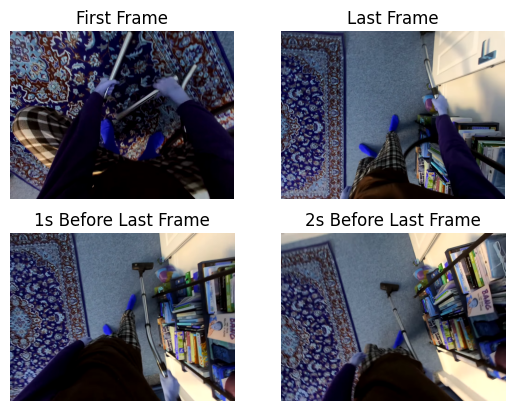

In [21]:
clip_file_path = get_frames_for_step(video_key, 21, narration_objs, video_path, clip_save_path)

In [22]:
# the complete clip for this step
Video.from_file(clip_file_path, width = 320, height = 320)

Video(value=b'\x00\x00\x00\x1cftypisom\x00\x00\x02\x00isomiso2mp41\x00\x00\x00\x08free\x00\xb7\xbe\x9b...', he…

## 2. annotations are slightly off, but we can fix by simple annotation

Annotation for step 26: #C C picks a cup of tea
Begin-time for step 26:  149.7367386
Ended-time for step 26: 156.48863859999997
------------
Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful


<Figure size 640x480 with 0 Axes>

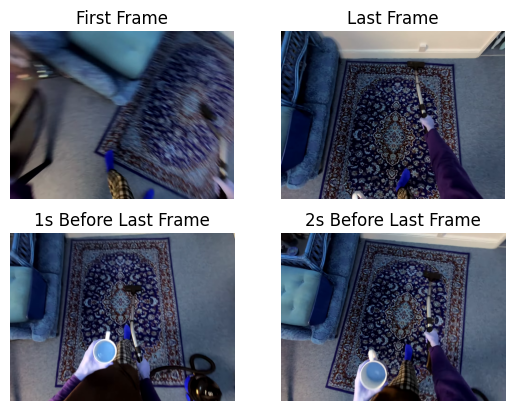

In [23]:
clip_file_path = get_frames_for_step(video_key, 26, narration_objs, video_path, clip_save_path)

In [24]:
# the complete clip for this step
Video.from_file(clip_file_path, width = 320, height = 320)

Video(value=b'\x00\x00\x00\x1cftypisom\x00\x00\x02\x00isomiso2mp41\x00\x00\x00\x08free\x00S\xe5\t...', height=…

# 1. Some steps annotated just for the purpose of action recognition is not interesting to us

In [25]:
video_key = "9043ef3a-0891-4760-b90d-e653fa8ad69b"
video_path = "/local1/jrbronkar/ego4d_videos/v1/full_scale/9043ef3a-0891-4760-b90d-e653fa8ad69b.mp4"
narrations_path = "/local1/jrbronkar/ego4d_videos/v1/annotations/narration.json"

In [26]:
# run this cell only once for each video and then test for any step
narration_objs = get_narrations(video_key, narrations_path)

Annotations for step 0: #C C looks at the phone
Begin-time for step 0:  0.007028600000000001
Finish-time for step 0: 0.9383885999999999
------------
Annotations for step 1: #C C picks the phone
Begin-time for step 1:  0.9383885999999999
Finish-time for step 1: 3.5603586000000003
------------
Annotations for step 2: #C C scrolls the phone
Begin-time for step 2:  3.5603586000000003
Finish-time for step 2: 7.7723686
------------
Annotations for step 3: #C C places the phone on the couch
Begin-time for step 3:  7.7723686
Finish-time for step 3: 8.4620886
------------
Annotations for step 4: #C C picks a book
Begin-time for step 4:  8.4620886
Finish-time for step 4: 9.4336886
------------
Annotations for step 5: #C C opens a book
Begin-time for step 5:  9.4336886
Finish-time for step 5: 15.0470486
------------
Annotations for step 6: #C C looks at the book
Begin-time for step 6:  15.0470486
Finish-time for step 6: 16.1918186
------------
Annotations for step 7: #C C opens a book page
Begin-

Annotation for step 26: #C C opens a book page
Begin-time for step 26:  155.93403859999998
Ended-time for step 26: 157.03487859999998
------------
Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful


<Figure size 640x480 with 0 Axes>

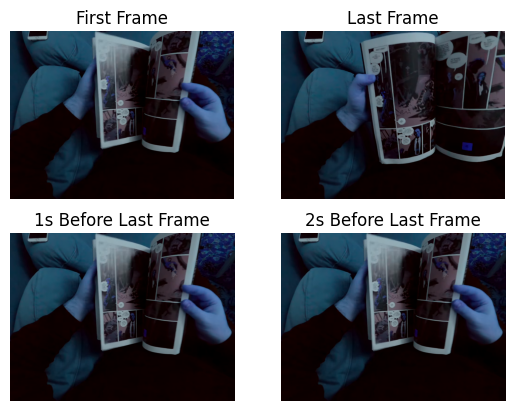

In [27]:
clip_file_path = get_frames_for_step(video_key, 26, narration_objs, video_path, clip_save_path)

In [28]:
# the complete clip for this step
Video.from_file(clip_file_path, width = 320, height = 320)

Video(value=b'\x00\x00\x00\x1cftypisom\x00\x00\x02\x00isomiso2mp41\x00\x00\x00\x08free\x00\x0ca0...', height='…

# Video 4

In [38]:
video_key = "dddc9ea3-2212-4641-84f7-20bb2d78dccc"
video_path = "/local1/jrbronkar/ego4d_videos/v1/full_scale/dddc9ea3-2212-4641-84f7-20bb2d78dccc.mp4"
narrations_path = "/local1/jrbronkar/ego4d_videos/v1/annotations/narration.json"

In [39]:
# run this cell only once for each video and then test for any step
narration_objs = get_narrations(video_key, narrations_path)

Annotations for step 0: #C C places his right hand on a steering wheel in the car.
Begin-time for step 0:  6.073
Finish-time for step 0: 5.973
------------
Annotations for step 1: #C C places his left hand on a gear in a car.
Begin-time for step 1:  5.973
Finish-time for step 1: 6.30396
------------
Annotations for step 2: #C C changes the gear in the car with his left hand.
Begin-time for step 2:  6.30396
Finish-time for step 2: 8.21184
------------
Annotations for step 3: #C C drives the car with the steering wheel in both hands.
Begin-time for step 3:  8.21184
Finish-time for step 3: 11.29282
------------
Annotations for step 4: #C C changes the gear in the car with his left hand.
Begin-time for step 4:  11.29282
Finish-time for step 4: 11.48508
------------
Annotations for step 5: #C C drives the car with the steering wheel in his right hand.
Begin-time for step 5:  11.48508
Finish-time for step 5: 15.936
------------
Annotations for step 6: #C C drives the car with the steering in

Annotation for step 50: #C C drives the car with the steering wheel in  both hands.
Begin-time for step 50:  231.33048
Ended-time for step 50: 232.89992
------------
Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful


<Figure size 640x480 with 0 Axes>

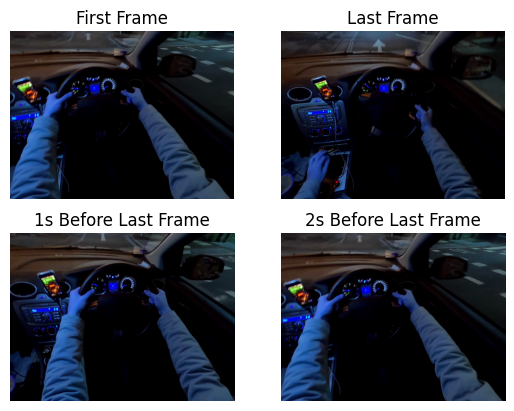

In [42]:
clip_file_path = get_frames_for_step(video_key, 50, narration_objs, video_path, clip_save_path)

In [43]:
# the complete clip for this step
Video.from_file(clip_file_path, width = 320, height = 320)

Video(value=b'\x00\x00\x00\x1cftypisom\x00\x00\x02\x00isomiso2mp41\x00\x00\x00\x08free\x00\x0b\xa4\xd2...', he…

In [33]:
# Video 5

In [44]:
video_key = "1f84d80d-6f8d-4e40-aabb-b33aad3ba594"
video_path = "/local1/jrbronkar/ego4d_videos/v1/full_scale/1f84d80d-6f8d-4e40-aabb-b33aad3ba594.mp4"
narrations_path = "/local1/jrbronkar/ego4d_videos/v1/annotations/narration.json"

Annotation for step 16: #C C removes hand gloves.
Begin-time for step 16:  48.718558593568645
Ended-time for step 16: 49.17216859356864
------------
Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful


<Figure size 640x480 with 0 Axes>

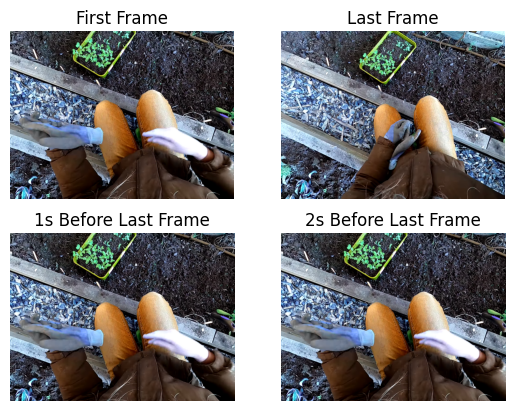

In [46]:
clip_file_path = get_frames_for_step(video_key, 188, narration_objs, video_path, clip_save_path)

In [47]:
# the complete clip for this step
Video.from_file(clip_file_path, width = 320, height = 320)

Video(value=b'\x00\x00\x00\x1cftypisom\x00\x00\x02\x00isomiso2mp41\x00\x00\x00\x08free\x00U\xaf\xcc...', heigh…

Annotation for step 109: #C C digs a hole in the flower pot.
Begin-time for step 109:  222.2574352602353
Ended-time for step 109: 224.1868352602353
------------
Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful


<Figure size 640x480 with 0 Axes>

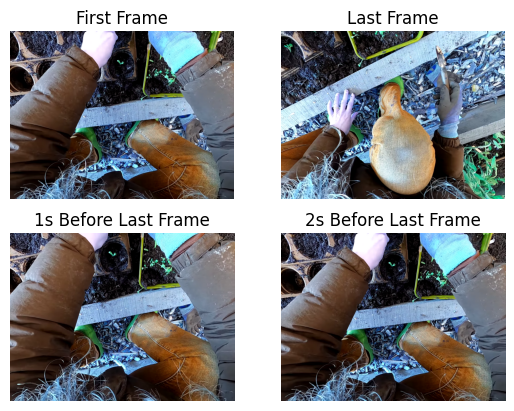

In [52]:
clip_file_path = get_frames_for_step(video_key, 109, narration_objs, video_path, clip_save_path)

In [53]:
# the complete clip for this step
Video.from_file(clip_file_path, width = 320, height = 320)

Video(value=b'\x00\x00\x00\x1cftypisom\x00\x00\x02\x00isomiso2mp41\x00\x00\x00\x08free\x00D\x07Y...', height='…